# Deep Learning for Asset Prediction

In this project, we implement a deep learning model to predict the future financial asset behavior. Specifically, we are concerned with predicting positive moves or up trends for daily returns. We will be treating this as a binary classification problem and due to the sequential time series nature of financial data we will be using a Long Short-Term Memory style neural network. This is a type of recurrent neural network which increases the short-term memory window to make learning and retaining previous information much easier.  

The asset we are choosing for this project is the S&P 500 ETF (SPY), which while uninspired is simple to work with, helps provide realistic comparison to buy and hold strategies (which often involve ETFs), and has readily accessible and high quality price data. We download daily price data from 2000 to 2020 from Yahoo Finance using the yfinance package, which includes OHLC, Adjusted Close, and Volume data.  

Using this data, we will perform feature engineering, exploratory data analysis, dimensionality reduction and feature selection, feature transformation, model building and hyperparameter tuning, model training, and finally evaluation using metrics and a backtested trading strategy.  

We start by importing all required packages for this project.

In [3]:
''' All required imports '''
import warnings
warnings.filterwarnings('ignore')

import datetime as dt
import yfinance as yf
import numpy as np
import pandas as pd
from pathlib import Path
import os
import quantstats as qs

import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sb

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay, classification_report
from boruta import BorutaPy
from sklearn.ensemble import RandomForestClassifier

import tensorflow
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Flatten, LSTM, Input
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import Accuracy, AUC, Precision, Recall

import keras_tuner as kt
from keras_tuner import HyperParameters
from keras_tuner.tuners import BayesianOptimization, RandomSearch, Hyperband

In [4]:
# Tensorboard path setup and loading
results_path = Path('results', 'lstm_time_series')
if not results_path.exists():
    results_path.mkdir(parents=True)

%reload_ext tensorboard

# Reset Seaborn plot style
sb.reset_defaults()

# Show all dataframe rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Collecting Data

Using the yfinance package, we download daily price data for the SPY ticker from 2004 to 2024 and create a dataframe to work with this data. We then display the dataframe to verify the price data and dates we have downloaded.

In [7]:
''' Download the data '''

stock = 'SPY'

start = dt.datetime(2000,1,1)
end = dt.datetime(2020,1,1)

df = yf.download(stock, start, end)
df = df.reset_index()

df.head(5)

[*********************100%%**********************]  1 of 1 completed


,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,148.25000,148.25000,143.875000,145.4375,93.290161,8164300
1,2000-01-04,143.53125,144.06250,139.640625,139.7500,89.641953,8089800
2,2000-01-05,139.93750,141.53125,137.250000,140.0000,89.802299,12177900
3,2000-01-06,139.62500,141.50000,137.750000,137.7500,88.359085,6227200
4,2000-01-07,140.31250,145.75000,140.062500,145.7500,93.490608,8066500


As stated previously, we can see that yfinance has downloaded the daily OHLC, Adjusted Close, and Volume data for SPY. Let's visualize the data to check that it looks reasonable.

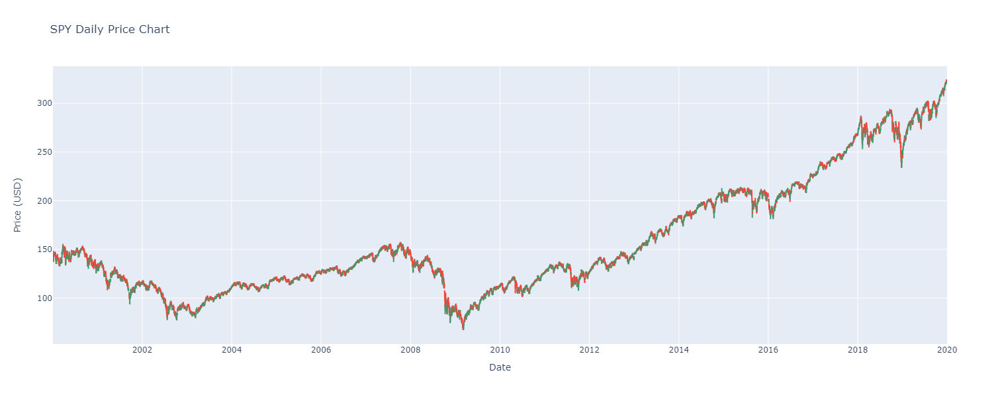

In [9]:
''' SPY Candlestick Plot '''

fig = go.Figure(data=[go.Candlestick(x=df['Date'], open=df['Open'], high=df['High'], low=df['Low'], close=df['Close'])])
fig.update_layout(xaxis_rangeslider_visible=False, width=1500, height=600, xaxis_title='Date', yaxis_title='Price (USD)', title='SPY Daily Price Chart')
fig.show()

## Feature Engineering and Cleaning

Before cleaning the data and performing exploratory data analysis, we perform exhaustive feature engineering using our initial data. For the case of predicting price trends, we will make use of various popular technical indicators often used by traders to determine buy and sell signals. While data and features such as sentiment anaylsis, historical reports, and other indicators could be used, these require a professional subscription (which we cannot access) and thus will not be used in this study. Regardless, we will produce a sufficiently large feature set through the use of multiple lookback and averaging windows for each indicator.  

The features we will use are as follows:
* Momentum, with lookback periods of 1, 2, 3, 4, 5, 7, 10, 14, 21, 28, 50, 100, 200, 500
* Logarthmic Returns, with lookback periods of 1, 2, 3, 4, 5, 7, 10, 14, 21, 28, 50, 100, 200, 500
* Simple Moving Average (SMA), with averaging windows of 5, 7, 10, 14, 21, 28, 50, 100, 200, 500
* Exponential Moving Average (EMA), with averaging windows of 5, 7, 10, 14, 21, 28, 50, 100, 200, 500
* Relative Strength Index (RSI), with averaging windows of 5, 7, 10, 14, 21, 28, 50, 100, 200, 500
* Moving Average Convergence Divergence (MACD), with window sets of (5,10), (7,14), (12,26), (25,50)
* Stochastic Oscillator (fast %K), with measuring windows of 5, 7, 10, 14, 21, 28, 50, 100, 200, 500
* Average True Range (ATR), with averaging windows of 5, 7, 10, 14, 21, 28, 50, 100, 200, 500
* Bollinger Bands (BB), with averaging windows of 5, 7, 10, 14, 21, 28, 50, 100, 200, 500
* On-Balance Volume (OBV), which is a rolling calculation over the entire dataset

We calculate these values and add them to the existing dataframe.

In [12]:
''' Feature Engineering '''

# Momentum
def momentum(value, period=1):
    df['Mom_%s_%d' % (value, period)] = df[value] - df[value].shift(period)
    return None

# Log Returns
def log_return(value, period=1):
    df['Log Ret_%s_%d' % (value, period)] = np.log(df[value] / df[value].shift(period))
    return None

# SMA
def SMA(value, period=5):
    df['SMA_%s_%d' % (value, period)] = df[value].rolling(period).mean()
    return None

# EMA
def EMA(value, period=5):
    df['EMA_%s_%d' % (value, period)] = df[value].ewm(span=period, adjust=False).mean()
    return None

# RSI
def RSI(value, period=5):
    delta = df[value].diff()
    dUp, dDown = delta.copy(), delta.copy()
    dUp[dUp < 0] = 0
    dDown[dDown > 0] = 0

    avgGain = pd.Series(dUp).rolling(period).mean()
    avgLoss = pd.Series(dDown).rolling(period).mean().abs()
    rs = avgGain/avgLoss
    df['RSI_%s_%d' % (value, period)] = 100.0 - (100.0/(1.0+rs))
    return None

# MACD
def MACD(value, period_1=12, period_2=26):
    df['MACD_%s_%d_%d' % (value, period_1, period_2)] = df[value].ewm(span=period_1, adjust=False).mean() - df[value].ewm(span=period_2, adjust=False).mean()
    return None

# Stochastic Oscillator (fast K)
def fastK(value, period=5):
    low_min = df['Low'].rolling(period).min()
    high_max = df['High'].rolling(period).max()
    df['fastK_%s_%d' % (value, period)] = 100 * (df[value] - low_min)/(high_max - low_min)
    return None

# ATR
def ATR(period=5):
    dfCopy = df.copy()
    dfCopy['tr0'] = abs(dfCopy['High'] - dfCopy['Low'])
    dfCopy['tr1'] = abs(dfCopy['High'] - dfCopy['Close'].shift())
    dfCopy['tr2'] = abs(dfCopy['Low'] - dfCopy['Close'].shift())
    dfCopy['tr'] = dfCopy[['tr0', 'tr1', 'tr2']].max(axis=1)
    df['ATR_%d' % (period)] = dfCopy['tr'].ewm(alpha=1/period, adjust=False).mean()
    return None

# Bollinger Bands
def BB(value, period=5):
    df['BB Upper_%s_%d' % (value, period)] = df[value].rolling(period).mean() + 2 * df[value].rolling(period).std()
    df['BB Lower_%s_%d' % (value, period)] = df[value].rolling(period).mean() - 2 * df[value].rolling(period).std()
    return None

# OBV
def OBV():
    df['OBV'] = (np.sign(df['Adj Close'].diff()) * df['Volume']).fillna(0).cumsum()


In [13]:
''' Add features to dataframe '''

mom_ret_windows = [1, 2, 3, 4, 5, 7, 10, 14, 21, 28, 50, 100, 200, 500]

for w in mom_ret_windows:
    momentum('Adj Close', w)
    log_return('Adj Close', w)

tech_windows = [5, 7, 10, 14, 21, 28, 50, 100, 200, 500]

for w in tech_windows:
    SMA('Adj Close', w)
    EMA('Adj Close', w)
    RSI('Adj Close', w)
    fastK('Close', w)
    ATR(w)
    BB('Adj Close', w)

MACD('Adj Close')
MACD('Adj Close', 5, 10)
MACD('Adj Close', 7, 14)
MACD('Adj Close', 25, 50)

OBV()

After engineering all the features and adding them to the dataframe, there will be some null values (due to the averaging windows leaving empty values when they cannot accumulate enough values). We remove these and clean the data, as well as reset the index before proceeding to exploratory data analysis.

In [15]:
df.dropna(inplace=True)
df.reset_index(drop=True, inplace=True)
df.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume,Mom_Adj Close_1,Log Ret_Adj Close_1,Mom_Adj Close_2,Log Ret_Adj Close_2,Mom_Adj Close_3,Log Ret_Adj Close_3,Mom_Adj Close_4,Log Ret_Adj Close_4,Mom_Adj Close_5,Log Ret_Adj Close_5,Mom_Adj Close_7,Log Ret_Adj Close_7,Mom_Adj Close_10,Log Ret_Adj Close_10,Mom_Adj Close_14,Log Ret_Adj Close_14,Mom_Adj Close_21,Log Ret_Adj Close_21,Mom_Adj Close_28,Log Ret_Adj Close_28,Mom_Adj Close_50,Log Ret_Adj Close_50,Mom_Adj Close_100,Log Ret_Adj Close_100,Mom_Adj Close_200,Log Ret_Adj Close_200,Mom_Adj Close_500,Log Ret_Adj Close_500,SMA_Adj Close_5,EMA_Adj Close_5,RSI_Adj Close_5,fastK_Close_5,ATR_5,BB Upper_Adj Close_5,BB Lower_Adj Close_5,SMA_Adj Close_7,EMA_Adj Close_7,RSI_Adj Close_7,fastK_Close_7,ATR_7,BB Upper_Adj Close_7,BB Lower_Adj Close_7,SMA_Adj Close_10,EMA_Adj Close_10,RSI_Adj Close_10,fastK_Close_10,ATR_10,BB Upper_Adj Close_10,BB Lower_Adj Close_10,SMA_Adj Close_14,EMA_Adj Close_14,RSI_Adj Close_14,fastK_Close_14,ATR_14,BB Upper_Adj Close_14,BB Lower_Adj Close_14,SMA_Adj Close_21,EMA_Adj Close_21,RSI_Adj Close_21,fastK_Close_21,ATR_21,BB Upper_Adj Close_21,BB Lower_Adj Close_21,SMA_Adj Close_28,EMA_Adj Close_28,RSI_Adj Close_28,fastK_Close_28,ATR_28,BB Upper_Adj Close_28,BB Lower_Adj Close_28,SMA_Adj Close_50,EMA_Adj Close_50,RSI_Adj Close_50,fastK_Close_50,ATR_50,BB Upper_Adj Close_50,BB Lower_Adj Close_50,SMA_Adj Close_100,EMA_Adj Close_100,RSI_Adj Close_100,fastK_Close_100,ATR_100,BB Upper_Adj Close_100,BB Lower_Adj Close_100,SMA_Adj Close_200,EMA_Adj Close_200,RSI_Adj Close_200,fastK_Close_200,ATR_200,BB Upper_Adj Close_200,BB Lower_Adj Close_200,SMA_Adj Close_500,EMA_Adj Close_500,RSI_Adj Close_500,fastK_Close_500,ATR_500,BB Upper_Adj Close_500,BB Lower_Adj Close_500,MACD_Adj Close_12_26,MACD_Adj Close_5_10,MACD_Adj Close_7_14,MACD_Adj Close_25_50,OBV
0,2002-01-02,115.110001,115.750000,113.809998,115.529999,75.843208,18651900,0.807457,0.010703,-0.308540,-0.004060,-0.347954,-0.004577,0.111603,0.001473,0.525200,0.006949,0.835701,0.011080,1.064682,0.014137,1.162804,0.015450,1.228226,0.016327,0.737564,0.009772,5.611580,0.076869,-3.635445,-0.046820,-1.952690,-0.025421,-17.446953,-0.207046,75.790695,75.656127,59.259449,58.503394,1.450989,76.721782,74.859608,75.676278,75.604075,62.162966,58.503394,1.444748,76.535135,74.817421,75.571819,75.522497,60.324556,58.503394,1.482346,76.429626,74.714012,75.184874,75.424438,57.125892,74.315764,1.552960,76.789761,73.579988,75.310805,75.235910,54.594360,58.833313,1.676433,77.087870,73.533740,75.253443,75.013799,52.011655,58.833313,1.776446,76.909515,73.597372,74.156692,74.462070,58.351688,80.144689,1.967043,77.923436,70.389948,73.251852,74.652359,47.560219,78.419330,2.188387,79.986551,66.517153,76.305675,76.922861,49.381222,56.751109,2.519737,85.237880,67.373470,85.052451,82.603166,48.139452,35.076670,3.189086,101.889004,68.215898,0.394076,0.133630,0.179637,0.648954,-248472600.0
1,2002-01-03,115.650002,116.949997,115.540001,116.839996,76.703209,15743000,0.860001,0.011275,1.667458,0.021979,0.551460,0.007216,0.512047,0.006698,0.971603,0.012748,1.240746,0.016308,1.479805,0.019481,1.937775,0.025588,2.533119,0.033583,2.094788,0.027690,5.084572,0.068588,-1.706490,-0.022004,0.443520,0.005799,-12.938744,-0.155880,75.985016,76.005155,64.800086,96.496795,1.444791,77.212741,74.757290,75.853528,75.878859,66.153534,96.496795,1.441212,76.977628,74.729428,75.719800,75.737172,63.280870,96.496795,1.476111,76.793794,74.645806,75.323287,75.594941,60.844974,97.777764,1.543462,77.097642,73.548932,75.431430,75.369301,59.190104,80.666606,1.664222,77.227080,73.635779,75.328257,75.130310,55.602518,80.666606,1.763716,77.051364,73.605150,74.258384,74.549957,57.687945,90.675214,1.956102,78.019988,70.496780,73.234787,74.692970,48.851538,84.087585,2.180703,79.925183,66.544391,76.307893,76.920676,50.141150,60.172362,2.514239,85.240272,67.375513,85.026573,82.579613,48.611955,37.191274,3.185548,101.874623,68.178523,0.463037,0.267983,0.283918,0.683542,-232729600.0
2,2002-01-04,117

## Exploratory Data Analysis and Label Specification

We start with the core features and distribution of each feature. This allows us to indentify any outliers or strange data as well as gives us a precursor to any feature selection decisions and feature scaling that will take place later.

In [18]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Date,4531,2010-12-31 08:46:17.664974336,2002-01-02 00:00:00,2006-07-01 12:00:00,2010-12-30 00:00:00,2015-07-01 12:00:00,2019-12-31 00:00:00,NaN
Open,4531.0,160.497215,67.949997,114.66,136.929993,204.889999,323.73999,60.690837
High,4531.0,161.361821,70.0,115.300003,137.639999,206.135002,323.799988,60.771301
Low,4531.0,159.544615,67.099998,113.860001,136.229996,203.985001,322.279999,60.572264
Close,4531.0,160.505939,68.110001,114.625,136.869995,205.074997,322.940002,60.695781
Adj Close,4531.0,129.980426,50.856674,82.806942,103.310638,174.790504,301.334717,62.823208
Volume,4531.0,123410248.13507,8055800.0,56807350.0,92841000.0,160062850.0,871026300.0,97645201.361779
Mom_Adj Close_1,4531.0,0.049722,-10.35289,-0.491203,0.079872,0.644695,10.84256,1.315375
Log Ret_Adj Close_1,4531.0,0.000306,-0.103637,-0.004092,0.000658,0.00551,0.135578,0.01163
Mom_Adj Close_2,4531.0,0.099037,-15.861801,-0.699173,0.164642,1.006279,12.573349,1.817981


The first thing to notice is the ranges of the features we have. Particularly, many of these features (like SMA and EMA) are in dollars or averaged dollar values, so their ranges tend to align with the price data range we originally downloaded. Bollinger bands, which outline the normal distribution around a given SMA, are naturally trailing or leading the actual price by the rolling variance.  

Other features are clearly valued differently. Momentum is directly comparing two prices, and thus the mean is close to zero with positive and negative value spread. As the lookback window widens, the distribution generally becomes wider, but the means remain quite similar. Meanwhile, the log returns are all less than one, which is the exact behavior that makes log returns useful. Again we see means close to zero and distributions widening as the lookback window widens. These data make it clear that large windows don't particularly add much information through direct values, but may add signals through comparison with shorter window values.  

The remaining features are well known technical indicators which range through a variety of values. The RSI and fastK stochastic oscillator range between 0 and 100, which allow us to double check our feature engineering for these values. The ATR is always a positive value measuring the range of prices, which effectively captures the volatility of the closing price. The MACD tends to rely on the underlying asset's price, and generally centers around zero. Finally volume and OBV are very large values (due to the sheer volume of trades being done on the market) and these values are quite spread out. This may prove to be less useful than other features due to scaling of these values before model training.  

Now let's visualize some of these key features over two years of the data to understand how they change over time in relation to the stock price data.

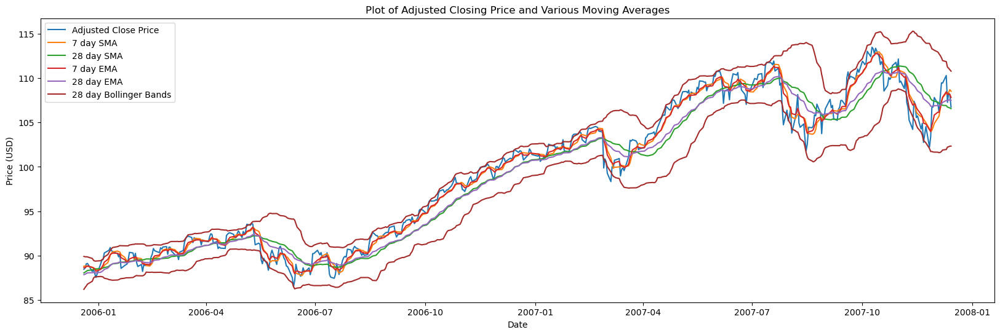

In [20]:
''' Adj Close and some SMAs and EMAs '''

plt.figure(figsize=(20,6))
plt.plot(df['Date'][1000:1500], df['Adj Close'][1000:1500], label='Adjusted Close Price')
plt.plot(df['Date'][1000:1500], df['SMA_Adj Close_7'][1000:1500], label='7 day SMA')
plt.plot(df['Date'][1000:1500], df['SMA_Adj Close_28'][1000:1500], label='28 day SMA')
plt.plot(df['Date'][1000:1500], df['EMA_Adj Close_7'][1000:1500], label='7 day EMA')
plt.plot(df['Date'][1000:1500], df['EMA_Adj Close_28'][1000:1500], label='28 day EMA')
plt.plot(df['Date'][1000:1500], df['BB Upper_Adj Close_28'][1000:1500], label='28 day Bollinger Bands', color='brown')
plt.plot(df['Date'][1000:1500], df['BB Lower_Adj Close_28'][1000:1500], color='brown')
plt.title('Plot of Adjusted Closing Price and Various Moving Averages')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.show()

We can clearly see the expected behavior from above in the price unit features. The moving averages roughly trace the actual price data, with more smoothing for longer averaging windows. Bollinger bands follow along with the moving average of the same window both above and below two standard deviations from the mean SMA. The bands react to volatility while the moving averages ignore daily volatility and can capture wider trends in the data. The SMA and EMA for the same window seem quite similar, with the EMA responding more quickly to drastic price changes.  

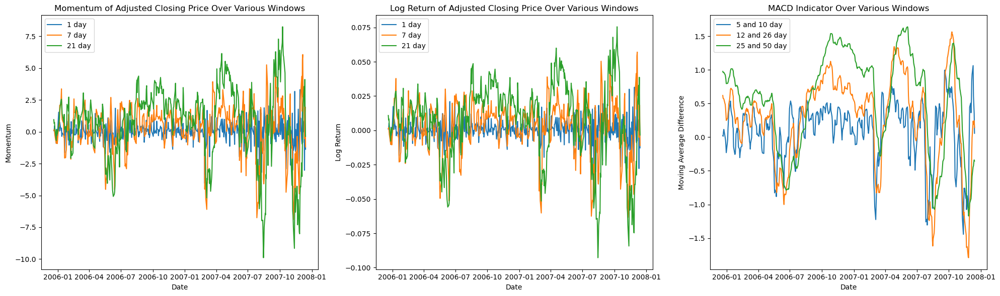

In [22]:
''' Multiple momentums, log returns, MACD plots '''

fig2, ax = plt.subplots(nrows=1, ncols=3, figsize=(20,6))

ax[0].plot(df['Date'][1000:1500], df['Mom_Adj Close_1'][1000:1500], label='1 day')
ax[0].plot(df['Date'][1000:1500], df['Mom_Adj Close_7'][1000:1500], label='7 day')
ax[0].plot(df['Date'][1000:1500], df['Mom_Adj Close_21'][1000:1500], label='21 day')
ax[0].set_title('Momentum of Adjusted Closing Price Over Various Windows')
ax[0].set_xlabel('Date')
ax[0].set_ylabel('Momentum')
ax[0].legend()

ax[1].plot(df['Date'][1000:1500], df['Log Ret_Adj Close_1'][1000:1500], label='1 day')
ax[1].plot(df['Date'][1000:1500], df['Log Ret_Adj Close_7'][1000:1500], label='7 day')
ax[1].plot(df['Date'][1000:1500], df['Log Ret_Adj Close_21'][1000:1500], label='21 day')
ax[1].set_title('Log Return of Adjusted Closing Price Over Various Windows')
ax[1].set_xlabel('Date')
ax[1].set_ylabel('Log Return')
ax[1].legend()

ax[2].plot(df['Date'][1000:1500], df['MACD_Adj Close_5_10'][1000:1500], label='5 and 10 day')
ax[2].plot(df['Date'][1000:1500], df['MACD_Adj Close_12_26'][1000:1500], label='12 and 26 day')
ax[2].plot(df['Date'][1000:1500], df['MACD_Adj Close_25_50'][1000:1500], label='25 and 50 day')
ax[2].set_title('MACD Indicator Over Various Windows')
ax[2].set_xlabel('Date')
ax[2].set_ylabel('Moving Average Difference')
ax[2].legend()

plt.tight_layout()
plt.show()

Momentum and log returns look very similar over the period we have plotted, wiht a major difference being the scaling of the values. This means we can likely ignore one of these during feature selection as there is redundant information in the model. The MACD indicator shows crossover and differences in two moving averages, which help track trends in the data, particularly mirroring very large up and down trends. Each MACD seems to produce similar data with larger windows being smoother overall. Thus again the data may be redundant and we could use a single MACD to encompass all relevant information.

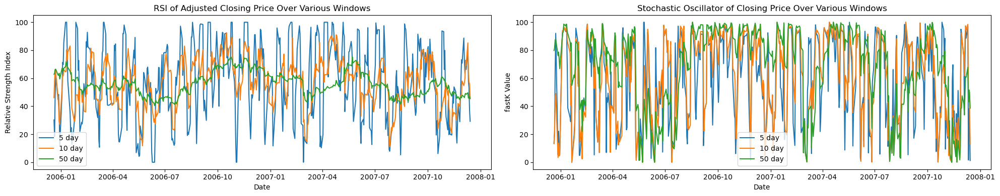

In [24]:
''' Multiple RSI and fastK plots '''

fig3, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,4))

ax[0].plot(df['Date'][1000:1500], df['RSI_Adj Close_5'][1000:1500], label='5 day')
ax[0].plot(df['Date'][1000:1500], df['RSI_Adj Close_10'][1000:1500], label='10 day')
ax[0].plot(df['Date'][1000:1500], df['RSI_Adj Close_50'][1000:1500], label='50 day')
ax[0].set_title('RSI of Adjusted Closing Price Over Various Windows')
ax[0].set_xlabel('Date')
ax[0].set_ylabel('Relative Strength Index')
ax[0].legend()

ax[1].plot(df['Date'][1000:1500], df['fastK_Close_5'][1000:1500], label='5 day')
ax[1].plot(df['Date'][1000:1500], df['fastK_Close_10'][1000:1500], label='10 day')
ax[1].plot(df['Date'][1000:1500], df['fastK_Close_50'][1000:1500], label='50 day')
ax[1].set_title('Stochastic Oscillator of Closing Price Over Various Windows')
ax[1].set_xlabel('Date')
ax[1].set_ylabel('fastK Value')
ax[1].legend()

plt.tight_layout()
plt.show()

Looking at RSI and Stochastic Oscillator behavior we see the expected values between 0 and 100 shown. Interesting is the differences in fluctuation in the RSI of various windows as the behavior is subdued in longer windows. Traditionally 30 and 70 act as thresholds for buy and sell, so it becomes clear that the shorter window will allow for more signals overall. Meanwhile the stochastic oscillator shows the current price as a percentage of the recent stock range. This means that we see the stock trend up when the fastK value reaches above 80 and is lower than 20 when the stock is trending down. For wider windows we see smoothing over the period as the indicator looks at the longer trend rather than rapid fluctuations.

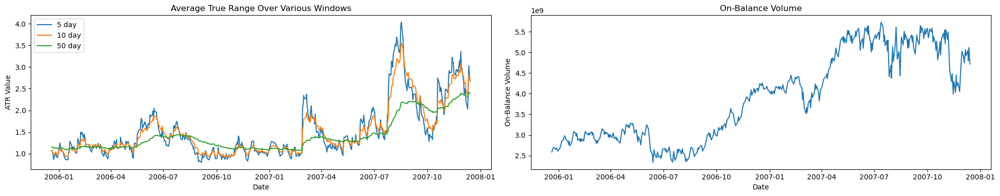

In [26]:
''' Various ATR and OBV plots '''

fig4, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,4))

ax[0].plot(df['Date'][1000:1500], df['ATR_5'][1000:1500], label='5 day')
ax[0].plot(df['Date'][1000:1500], df['ATR_10'][1000:1500], label='10 day')
ax[0].plot(df['Date'][1000:1500], df['ATR_50'][1000:1500], label='50 day')
ax[0].set_title('Average True Range Over Various Windows')
ax[0].set_xlabel('Date')
ax[0].set_ylabel('ATR Value')
ax[0].legend()

ax[1].plot(df['Date'][1000:1500], df['OBV'][1000:1500])
ax[1].set_title('On-Balance Volume')
ax[1].set_xlabel('Date')
ax[1].set_ylabel('On-Balance Volume')

plt.tight_layout()
plt.show()

Finally we plot the ATRs and OBV. Immediately we can see that OBV lacks resolution due to the order of magnitude of the indicator. This likely means when we scale we will lose much of the minute details in the data. However the OBV seems to track the price data quite well, so it may remain a useful feature later in the study. Finally the ATR directly shows spikes in movement directly. This can be useful to see when the market is moving rapidly and volatility is increasing. However, this indicator doesn't provide any indication of the direction of the move, and thus may not be useful on its own.  

Before continuing to feature selection, we will define our target labeling to train the model. We will derive this by comparing the relating difference between a given day's adjusted closing price and the next day's price. If this positive return is greater than 0.06%, we will label this a 1 indicating a positive return. Otherwise it will be labeled a 0. This is primarily due to class balancing between the two labels, which will prevent our model from choosing only one label to maximize its accuracy.  

Below is the code to perform this labeling. We will also take this time to trim our initial dataframe to create the feature set (by dropping the initial data we downloaded). We then check the quantity of 0 and 1 labels to ensure they are somewhat equivalent before proceeding.

In [28]:
features = df.drop(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], axis=1)
X = features

y = np.where(df['Adj Close'].shift(-1) > 1.0006 * df['Adj Close'],1,0)

pd.Series(y).value_counts()

1    2285
0    2246
Name: count, dtype: int64

## Feature Selection and Transformation

Before analyzing our features to trim our model inputs, we will first split our data into training, validation, and testing sets. We perform this split to separate the data on which we train, optimize hyperparameters, and test results, which could interfere with proper model evaluation. We also perform this split here so as to quarentine the validation and test data from our feature selection analysis. This also prevents leakage of the evaluation data in our training, and ensures we are not choosing features that will help us excel specifically in model testing.  

Below, we split our data such that 60% is used for training, 20% saved for validation in hyperparameter tuning, and 20% used for testing. We also perform this split for the target classification and verify the number of data points of each.

In [31]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2, shuffle=False)
Xtrain, Xval, ytrain, yval = train_test_split(Xtrain, ytrain, test_size=0.25, shuffle=False)

Xtrain.shape, Xtest.shape, Xval.shape, ytrain.shape, ytest.shape, yval.shape

((2718, 103), (907, 103), (906, 103), (2718,), (907,), (906,))

We start feature selection by looking at the relationships between features. To do this we use multi-collinearity analysis with a correlation matrix and scatter plots of the features. This anaylsis will help identify features which encode the same or similar information, as well as showcase any linear or non-linear behavior which will determine next steps in feature selection (such as principle component analysis or a random forest algorithm).  

Below is the correlation matrix of all features as well as the target output (labeled Output). We plot the matrix as a heatmap to directly visualize all features effectively.

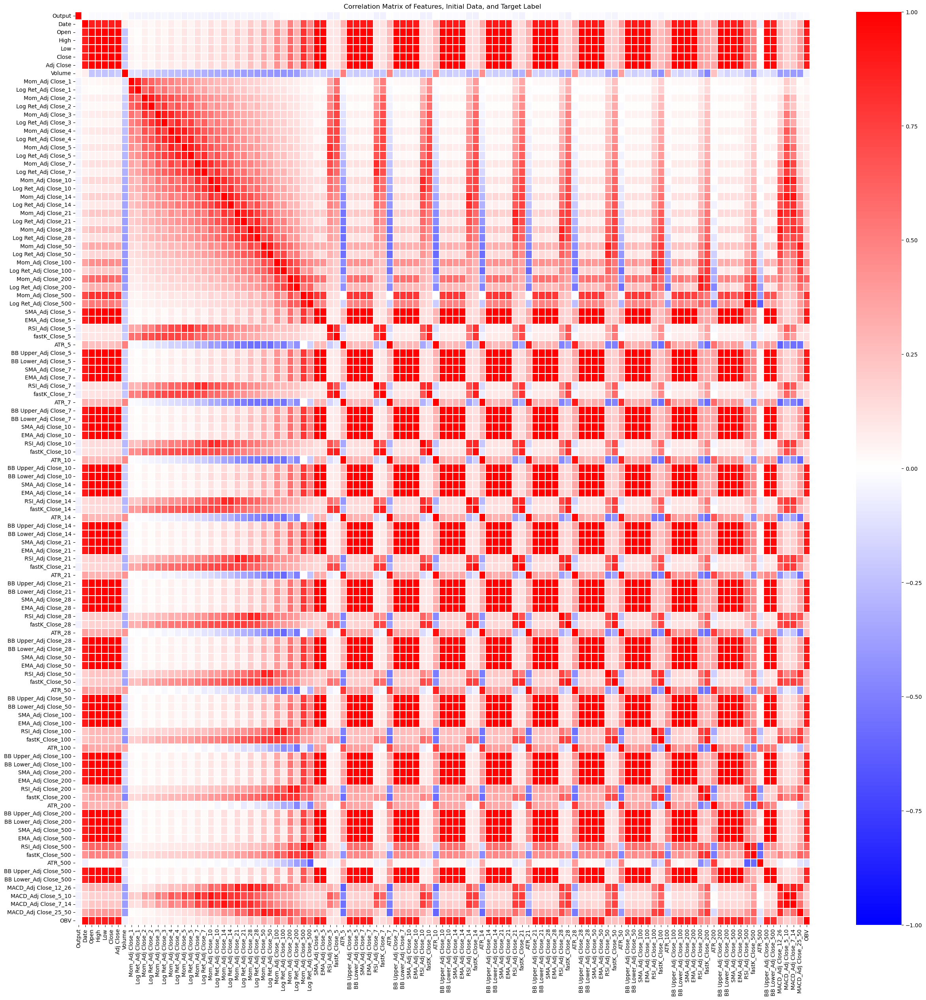

In [33]:
full_feature_set = df.copy()
full_feature_set.insert(0, "Output", y, True)
corr = full_feature_set.corr()
plot = plt.subplots(1,1, figsize=(30, 30))
heat = sb.heatmap(corr, cmap='bwr', linewidths=0.25, square=False, vmin=-1, vmax=1)
heat.set_title('Correlation Matrix of Features, Initial Data, and Target Label')
plt.show()

Immediately we should note that there is little to no correlation between any feature and the target labels. Only various RSI and fastK indicators seem to show a very slight negative correlation here. For feature to feature correlation, we see large correlation with indicators over different lookback windows. As we saw in our EDA earlier, momentum and log return metrics of similar windows show high correlation, as do both moving averages and their related bollinger bands. The ATR is also highly correlated to these moving average based indicators.  

Of particular interest is the behavior of MACD, RSI, and fastK. The MACD indicators are all similarly correlated with each other, but are also strongly correlated to the log returns and momentum indicators. The biggest outliers here are the RSI and fastK indicators which are correlated strongly with log returns and momentums around the same lookback window, as well as other RSI and fastK values. We see little to no correlation with many of the other indicators, and surprising negative correlation with the ATR value.  

From this matrix we can see that many of our features are strongly correlated with each other and are likely providing the same information to the model. Thus we will look at feature selection to reduce the dimensionality of this set and prevent overfitting. Next we look at the relationship between features.

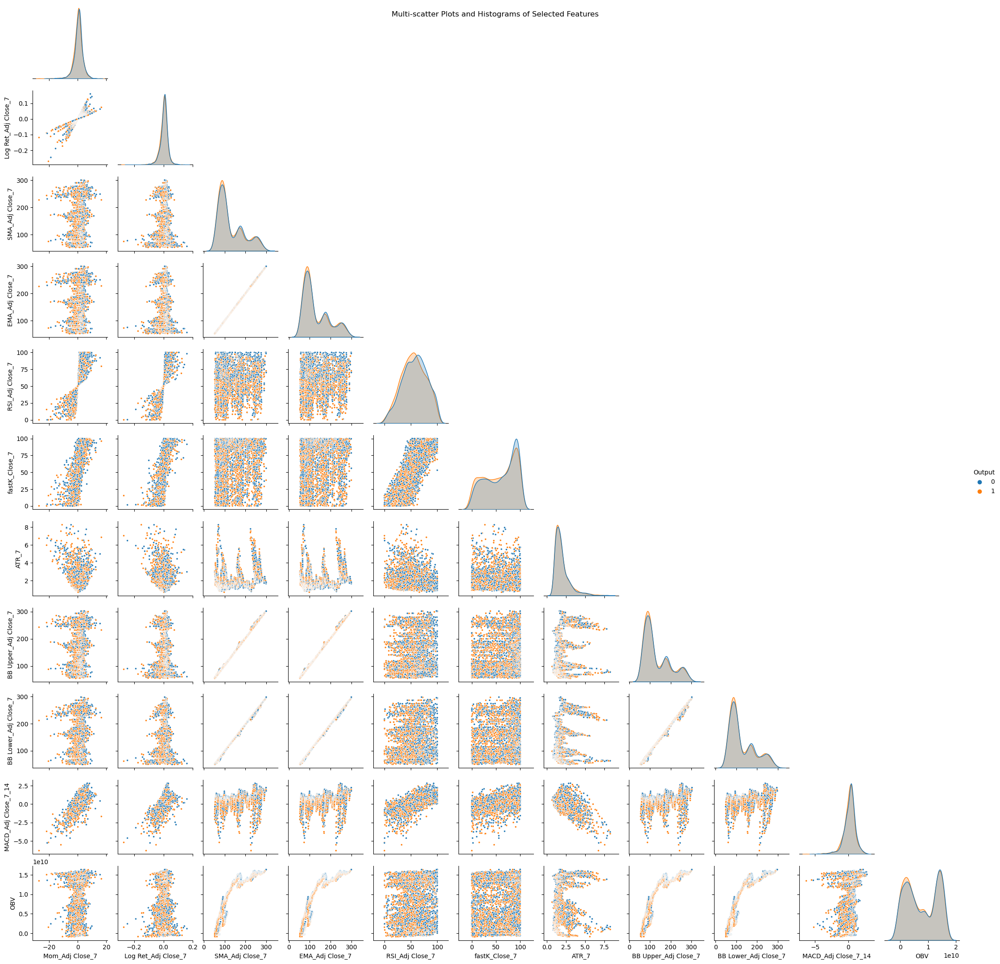

In [35]:
pplot = sb.pairplot(full_feature_set, vars=['Mom_Adj Close_7', 'Log Ret_Adj Close_7', 'SMA_Adj Close_7', 'EMA_Adj Close_7', 'RSI_Adj Close_7', 'fastK_Close_7', 'ATR_7', 
                             'BB Upper_Adj Close_7', 'BB Lower_Adj Close_7', 'MACD_Adj Close_7_14', 'OBV'], corner=True, hue='Output', height=2, markers=".")
pplot.fig.suptitle('Multi-scatter Plots and Histograms of Selected Features')
plt.show()

Again as expected we see linear relationships in moving average based indicators and in the momentum, log return, RSI, fastK, and MACD values. This means using something like PCA to reduce dimensionality is likely not advisable and thus we will use a different strategy for feature selection. We also see that there doesn't appear to be any clear distribution differences or linear differences for 1 or 0 target labels. This again does not help us directly decide which features to select and thus we will go into feature selection with an algorithm.  

Becuase of the non-linearity of some features and the inability to see correlations with the target output, we will use random forests and the Boruta algorithm to choose features. This algorithm runs repeated random forest classifiers with randomized feature labels to choose features which provide statistically significant information. This is a fast and direct way to find feature importance and only needs to be performed once before the neural network training.

In [37]:
''' Fix for borutapy '''
np.int = np.int32
np.float = np.float64
np.bool = np.bool_

forest = RandomForestClassifier(n_jobs=-1, class_weight='balanced', max_depth=4)

feat_selector = BorutaPy(forest, n_estimators='auto', verbose=1, perc=75)
feat_selector.fit(Xtrain.values, ytrain)

Xtrain = feat_selector.transform(Xtrain.values)
Xtest = feat_selector.transform(Xtest.values)
Xval = feat_selector.transform(Xval.values)
print(list(features.loc[:,feat_selector.support_].columns))

Iteration: 1 / 100
Iteration: 2 / 100
Iteration: 3 / 100
Iteration: 4 / 100
Iteration: 5 / 100
Iteration: 6 / 100
Iteration: 7 / 100
Iteration: 8 / 100
Iteration: 9 / 100
Iteration: 10 / 100
Iteration: 11 / 100
Iteration: 12 / 100
Iteration: 13 / 100
Iteration: 14 / 100
Iteration: 15 / 100
Iteration: 16 / 100
Iteration: 17 / 100
Iteration: 18 / 100
Iteration: 19 / 100
Iteration: 20 / 100
Iteration: 21 / 100
Iteration: 22 / 100
Iteration: 23 / 100
Iteration: 24 / 100
Iteration: 25 / 100
Iteration: 26 / 100
Iteration: 27 / 100
Iteration: 28 / 100
Iteration: 29 / 100
Iteration: 30 / 100
Iteration: 31 / 100
Iteration: 32 / 100
Iteration: 33 / 100
Iteration: 34 / 100
Iteration: 35 / 100
Iteration: 36 / 100
Iteration: 37 / 100
Iteration: 38 / 100
Iteration: 39 / 100
Iteration: 40 / 100
Iteration: 41 / 100
Iteration: 42 / 100
Iteration: 43 / 100
Iteration: 44 / 100
Iteration: 45 / 100
Iteration: 46 / 100
Iteration: 47 / 100
Iteration: 48 / 100
Iteration: 49 / 100
Iteration: 50 / 100
Iteration

The Boruta algorithm has cut nearly 90% of features out to reduce the input set to only 11 features. Many of these relate directly to our collinearity and data exploration where fastK and RSI seem to be the best indicators of the target label and provide the most unique information. The algorithm also seems to favor 5 to 14 day windows with the exception of the 500 day lower Bollinger Band. This also seems to help indicate the importance of short term information over long term information.  We now trim all feature sets used later to these 11 features.  

Now that we have selected a set of features, we can prepare the data before starting model construction. For LSTM neural networks it is best to use a minmax scaler, which will scale values between 0 and 1 for all features. We do this buy fitting the transformation to the training data, and then applying the same transformation to the testing and validation data. This is to ensure that all data is scaled the same and to prevent any issues with incorrect scaling when evaluating the model.  

After scaling we need to setup our data to be used specifically in an LSTM model. Because of its memory capacity, our data must must be trasnformed into sequences of time series data so that the model can learn iteratively. As a result we use the TimeseriesGenerator function to create three dimensional input: batch size x lookback window size x number of features. This function also packages our target labels with the input data, allowing us to pass a single tensor into the model to be used. We perform this transformation to all sets of data, including the testing data, as that will be passed into the model for evaluation later. We can verify the shape of the data by looking into the test data's shape, which should output a series of batches with 128 sets of 28 datapoints with 11 features each.

In [39]:
scaler = MinMaxScaler()
Xtrain = scaler.fit_transform(Xtrain)
Xtest = scaler.transform(Xtest)
Xval = scaler.transform(Xval)

lookback = 28
num_feats = Xtrain.shape[1]

train_set = TimeseriesGenerator(Xtrain, ytrain, length=lookback)
test_set = TimeseriesGenerator(Xtest, ytest, length=lookback)
val_set = TimeseriesGenerator(Xval, yval, length=lookback)

for i in range(len(test_set)):
    a, b = test_set[i]
    print(a.shape, b.shape)

(128, 28, 11) (128,)
(128, 28, 11) (128,)
(128, 28, 11) (128,)
(128, 28, 11) (128,)
(128, 28, 11) (128,)
(128, 28, 11) (128,)
(111, 28, 11) (111,)


## Base Model Construction and Evaluation

We start our model building with a base model using a naive LSTM approach. This is primarily to allow comparison between a base model and a later hyperparameter optimized model, which will justify that optimization effort as well as provide insight into future optimization or model construction. This base model will consist of 3 hidden layers with 10 neurons each, using a relu activation function and 0.4 dropout rate between each LSTM layer. This output is a dense layer with a sigmoid activation (which we can round later for our evaluation of 0 and 1 labels). Using an Adam optimizer with learning rate 0.001 and binary cross-entropy, we can construct and then train the model minimizing the loss.

In [41]:
def create_model(hu=64, lookback=60, features=1):

    tensorflow.keras.backend.clear_session()

    model = Sequential()
    model.add(Input(shape=(lookback, num_feats)))

    model.add(LSTM(units=hu, activation='relu', return_sequences=True, name='LSTM1'))
    model.add(Dropout(0.4, name='Dropout1'))

    model.add(LSTM(units=hu, activation='relu', return_sequences=True, name='LSTM2'))
    model.add(Dropout(0.4, name='Dropout2'))

    model.add(LSTM(units=hu, activation='relu', return_sequences=False, name='LSTM3'))

    model.add(Dense(units=1, activation='sigmoid', name='Output'))

    opt = Adam(learning_rate=0.001, epsilon=1e-08)

    model.compile(optimizer=opt, loss=BinaryCrossentropy(), metrics=['accuracy', Precision(), Recall()])

    return model

In [42]:
base_model = create_model(hu=10, lookback=lookback, features=num_feats)
base_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ LSTM1 (LSTM)                    │ (None, 28, 10)         │           880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dropout1 (Dropout)              │ (None, 28, 10)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ LSTM2 (LSTM)                    │ (None, 28, 10)         │           840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dropout2 (Dropout)              │ (None, 28, 10)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ LSTM3 (LSTM)                    │ (None, 10)             │           840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,571 (10.04 KB)

 Trainable params: 2,571 (10.04 KB)

 Non-trainable params: 0 (0.00 B)

Here we see the constructed model ready for training. We can verify the shape of data input and output in each layer, as well as the number of parameters to be trained. Now, we set up logging and callbacks for early stopping and best model checkpoints, as well as setting up Tensorboard to be viewed later. We then fit the model to the training data and evaluate it against the test data.

In [43]:
model_path = (results_path / 'basemodel.keras').as_posix()
logdir = os.path.join("./tensorboard/baselogs", dt.datetime.now().strftime("%Y%m%d-%H%M%S"))

my_callbacks = [
    EarlyStopping(patience=20, monitor='loss', mode='min', verbose=1, restore_best_weights=True),
    ModelCheckpoint(filepath=model_path, verbose=1, monitor='loss', save_best_only=True),
    TensorBoard(log_dir=logdir, histogram_freq=1)
]

In [44]:
base_history = base_model.fit(train_set, epochs=500, verbose=1, shuffle=False, callbacks=my_callbacks)

Epoch 1/500
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4922 - loss: 0.6952 - precision: 0.4961 - recall: 0.8883
Epoch 1: loss improved from inf to 0.69411, saving model to results/lstm_time_series/basemodel.keras
22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - accuracy: 0.4928 - loss: 0.6951 - precision: 0.4967 - recall: 0.8871
Epoch 2/500
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4928 - loss: 0.6937 - precision: 0.4951 - recall: 0.8558
Epoch 2: loss improved from 0.69411 to 0.69340, saving model to results/lstm_time_series/basemodel.keras
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.4934 - loss: 0.6937 - precision: 0.4957 - recall: 0.8583
Epoch 3/500
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4993 - loss: 0.6934 - precision: 0.4994 - recall: 0.9984
Epoch 3: loss improved from 0.69340 to 0.69310, saving model to results/lstm_time_series/basemodel.keras
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.4998 - loss: 0.6934 - precision: 0.4998 - re

Below is the TensorBoard visualization of the base model training. (Note: this does not appear in the HTML/PDF file)

In [119]:
%tensorboard --logdir ./tensorboard/baselogs --host localhost

Below we predict the targets using the test dataset and then compare them to the true labels from the data. To evaluate model performance we use a confusion matrix and ROC Curve as well as a classification report. These methods allow us to see how well effectively and efficiently the model predicts up trends in the price data, especially compared to a randomized selection.

In [135]:
y_pred = np.where(base_model.predict(test_set)>0.5,1,0)

pred_df = pd.DataFrame({'actual': ytest[lookback:],
                    'prediction': y_pred[:,0]})
pred_df.dropna(inplace=True)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step


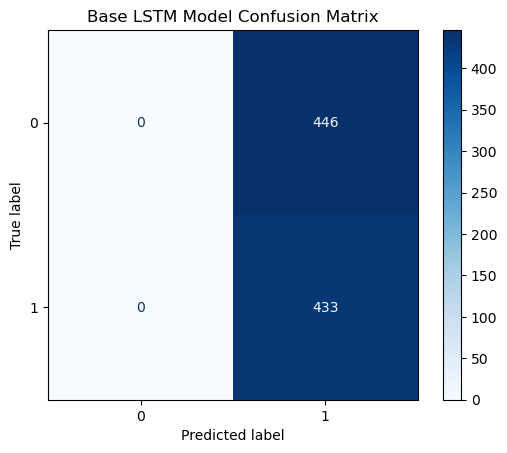

In [136]:
disp = ConfusionMatrixDisplay.from_predictions(pred_df['actual'], pred_df['prediction'], cmap=plt.cm.Blues)
plt.grid(False)
plt.title("Base LSTM Model Confusion Matrix")
plt.show()

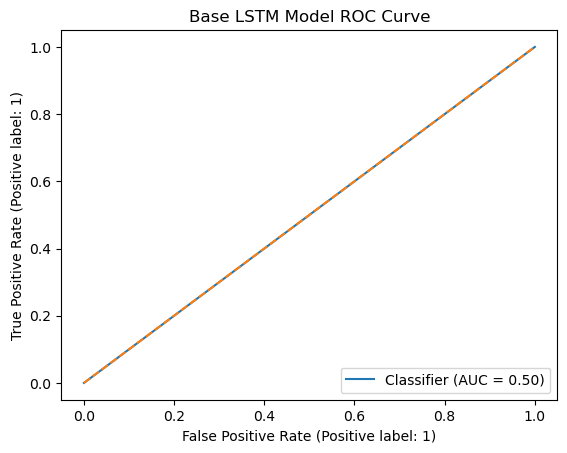

In [141]:
disp = RocCurveDisplay.from_predictions(pred_df['actual'], pred_df['prediction'])
plt.plot([0,1],[0,1], linestyle='--')
plt.title("Base LSTM Model ROC Curve")
plt.show()

In [48]:
print(classification_report(pred_df['actual'], pred_df['prediction']))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       446
           1       0.49      1.00      0.66       433

    accuracy                           0.49       879
   macro avg       0.25      0.50      0.33       879
weighted avg       0.24      0.49      0.33       879



The base model does not look very promising, as we see the AUC curve at 0.5, exactly the same as a 50/50 chance selection of the target. This is beccause our model chose the 1 target label for every test datapoint which is visible in the confusion matrix where all values are labeled as 1 regardless of if they are 1 or 0. While this looks amazing for the recall of positive up trends in the data (where recall is the model's ability to avoid false negative predictions) it does not mean much because the model always chooses this option regardless of input data. We can also see that the precision is below 50% which we would assume to be worse than even a random coin flip model. It is clear from this quick and naive model that hyperparameter optimization could genuinely benefit the LSTM model's prediction capability.

## Hyperparameter Tuning and Optimized Model Training

We know build a hyperparameter tuning model. This is done through KerasTuner, which allows us to build a model much like we did previously while specifying which hyperparameters to tune. For our model, we will be tuning the number of hidden layers (with a minimum of at least one), the number of units in each layer, the activation function for each layer, the dropout rate of each layer, and the learning rate for the Adam optimizer.  

We then use a Bayesian Optimizer algorithm from KerasTuner which searches the hyperparameter space in a probabilistic method to predict the best hyperparameters available. This takes some time to run, but after optimizing once we can extract the best hyperparameters and apply them to a new model.  We can view the results of the tuning and the best hyperparameters below, as well as in Tensorboard later.

In [49]:
def build_model(hp):

    tensorflow.keras.backend.clear_session()

    model = Sequential()
    model.add(Input(shape=(lookback, num_feats)))

    for i in range(hp.Int('num_layers', 0, 5)):
        model.add(LSTM(units=hp.Int('units_'+str(i), 4, 32, step=4),
                       activation=hp.Choice('activation_'+str(i), values=['relu', 'elu', 'tanh'], ordered=False),
                       return_sequences=True, name='LSTM_'+str(i)))

        model.add(Dropout(hp.Float('dropout_rate_'+str(i), 0.0, 0.5, step=0.1), name='Dropout_'+str(i)))

    model.add(LSTM(units=hp.Int('units_final', 4, 32, step=4),
                activation=hp.Choice('activation_final', values=['relu', 'elu', 'tanh'], ordered=False),
                return_sequences=False, name='LSTM_final'))

    model.add(Dense(units=1, activation='sigmoid', name='Output'))

    opt = Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4]), epsilon=1e-8)

    model.compile(optimizer=opt, loss=BinaryCrossentropy(), metrics=['accuracy', Precision(), Recall()])

    return model

In [50]:
callback = [EarlyStopping(patience=10, monitor='loss', mode='min', verbose=1, restore_best_weights=True), TensorBoard(log_dir="./tensorboard/bologs")]

botuner = BayesianOptimization(build_model, objective="val_accuracy", max_trials=15, num_initial_points=2, hyperparameters=None, tune_new_entries=True, allow_new_entries=True,
                               directory="./keras", project_name="botrial", overwrite=True)
botuner.search(train_set, epochs=50, validation_data=val_set, callbacks=callback, shuffle=False, verbose=1)

best_hps = botuner.get_best_hyperparameters()[0]
model = botuner.hypermodel.build(best_hps)
botuner.results_summary()

Trial 15 Complete [00h 00m 10s]
val_accuracy: 0.5307517051696777

Best val_accuracy So Far: 0.5307517051696777
Total elapsed time: 00h 04m 34s
Results summary
Results in ./keras\botrial
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 02 summary
Hyperparameters:
num_layers: 0
units_final: 20
activation_final: relu
learning_rate: 0.01
units_0: 24
activation_0: elu
dropout_rate_0: 0.0
units_1: 20
activation_1: tanh
dropout_rate_1: 0.2
units_2: 28
activation_2: elu
dropout_rate_2: 0.0
units_3: 4
activation_3: relu
dropout_rate_3: 0.1
Score: 0.5307517051696777

Trial 14 summary
Hyperparameters:
num_layers: 0
units_final: 16
activation_final: relu
learning_rate: 0.01
units_0: 20
activation_0: elu
dropout_rate_0: 0.0
units_1: 16
activation_1: tanh
dropout_rate_1: 0.2
units_2: 28
activation_2: elu
dropout_rate_2: 0.0
units_3: 8
activation_3: relu
dropout_rate_3: 0.1
Score: 0.5307517051696777

Trial 11 summary
Hyperparameters:
num_layers: 0
units_final: 20
activati

Below is the TensorBoard visualization for the Bayesian Optimization tuner. (Note: this does not appear in the HTML/PDF file)

In [117]:
%tensorboard --logdir ./tensorboard/bologs --host localhost

In [51]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ LSTM_final (LSTM)               │ (None, 20)             │         2,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 1)              │            21 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,581 (10.08 KB)

 Trainable params: 2,581 (10.08 KB)

 Non-trainable params: 0 (0.00 B)

We can see that the tuned model is quite different in every hyperparameter factor. It has only one layer, no dropout, and higher learning rate. This indicates overfitting with our original base model as this tuned model should be less prone to that behavior. Now we setup a callback, Tensorboard logs, and train the model on the dataset.

In [52]:
model_path = (results_path / 'model.keras').as_posix()
logdir = os.path.join("./tensorboard/logs", dt.datetime.now().strftime("%Y%m%d-%H%M%S"))

my_callbacks = [
    EarlyStopping(patience=20, monitor='loss', mode='min', verbose=1, restore_best_weights=True),
    ModelCheckpoint(filepath=model_path, verbose=1, monitor='loss', save_best_only=True),
    TensorBoard(log_dir=logdir, histogram_freq=1)
]

In [53]:
history = model.fit(train_set, epochs=500, verbose=1, shuffle=False, callbacks=my_callbacks)

Epoch 1/500
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5237 - loss: 0.6946 - precision: 0.4545 - recall: 0.4643       
Epoch 1: loss improved from inf to 0.69482, saving model to results/lstm_time_series/model.keras
22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.5231 - loss: 0.6946 - precision: 0.4574 - recall: 0.4651
Epoch 2/500
21/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.4990 - loss: 0.6953 - precision: 0.4990 - recall: 1.0000
Epoch 2: loss improved from 0.69482 to 0.69377, saving model to results/lstm_time_series/model.keras
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4999 - loss: 0.6951 - precision: 0.4999 - recall: 1.0000
Epoch 3/500
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.4995 - loss: 0.6938 - precision: 0.4995 - recall: 1.0000
Epoch 3: loss improved from 0.69377 to 0.69300, saving model to results/lstm_time_series/model.keras
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4999 - loss: 0.6937 - precision: 0.4999 - recall: 1.

Before evaluating our trained model, we can open Tensorboard and explore the model training progress. (Note: this does not appear in the HTML/PDF file)

In [115]:
%tensorboard --logdir ./tensorboard/logs --host localhost

## Tuned Model Evaluation and Trading Strategy Backtesting

Finally, we can apply our test dataset to the tuned model to evaluate performance. We repeat the procedure above where we produce our model's predicted targets and produce the ROC curve, confusion matrix, and classification report.

In [143]:
y_pred = np.where(model.predict(test_set)>0.5,1,0)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


In [144]:
pred_df = pd.DataFrame({'actual': ytest[lookback:],
                    'prediction': y_pred[:,0]})

pred_df.dropna(inplace=True)

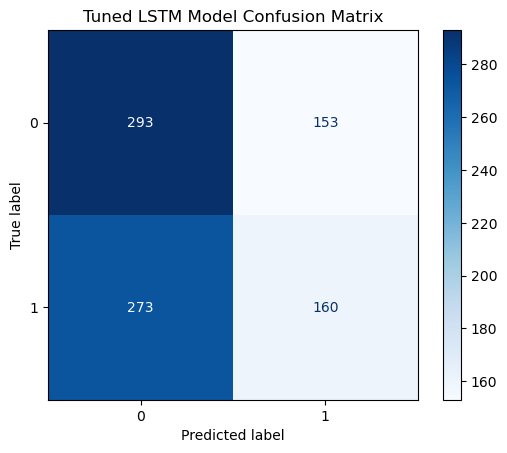

In [147]:
disp = ConfusionMatrixDisplay.from_predictions(pred_df['actual'], pred_df['prediction'], cmap=plt.cm.Blues)
plt.grid(False)
plt.title("Tuned LSTM Model Confusion Matrix")
plt.show()

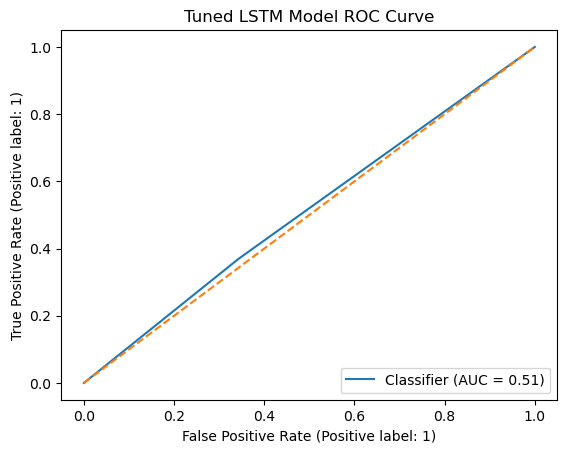

In [149]:
disp = RocCurveDisplay.from_predictions(pred_df['actual'], pred_df['prediction'])
plt.plot([0,1],[0,1], linestyle='--')
plt.title("Tuned LSTM Model ROC Curve")
plt.show()

In [59]:
print(classification_report(pred_df['actual'], pred_df['prediction']))

              precision    recall  f1-score   support

           0       0.52      0.66      0.58       446
           1       0.51      0.37      0.43       433

    accuracy                           0.52       879
   macro avg       0.51      0.51      0.50       879
weighted avg       0.51      0.52      0.51       879



Immediately we can see that this model is already better than the earlier base model. However, this improvement is quite marginal, with a precision of 0.51 for 1 labels. This time, our model is indeed distinguishing 0 and 1 labels, with a precision of 0.52 for 0s. This very marginally better than a random choice model, which we can see displayed in the ROC curve. This is quite poor relative to the amount of training put into the model, and would definitely not be sufficient to be deployed in a trading system.  

Even with such a poor model result, we can try and simulate a backtest to compare our model's performance over the whole dataset period with a base "buy and hold" strategy. This will provide a different viewpoint for evaluating model performance in metrics outside of pure statistics and label accuracy. For example, a model which is average at predicting up trends in general, but appears to successfully navigate a turbulent or sharp dropping market would be quite interesting and useful, especially compared to a bullish market where gains (particularly in an index like SPY) are difficult to produce. We create a new dataframe with a new signal column containing or predicted labels. When this label is 1, we buy into the market and sell on the next close or open, whichever is higher. We then find our profit (or loss) by taking the exit and entry price difference, and get returns for our strategy. We then calculate returns for the base strategy, which is just tracking the index directly. We use quantstat's report feature to analyze the results of these strategies.

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2002-02-13   2002-02-13
End Period                 2019-12-31   2019-12-31
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       59.0%

Cumulative Return          113.38%      165.42%
CAGR﹪                     2.97%        3.84%

Sharpe                     0.32         0.53
Prob. Sharpe Ratio         91.29%       98.98%
Smart Sharpe               0.31         0.51
Sortino                    0.45         0.89
Smart Sortino              0.43         0.84
Sortino/√2                 0.32         0.63
Smart Sortino/√2           0.3          0.6
Omega                      1.14         1.14

Max Drawdown               -60.73%      -31.81%
Longest DD Days            2339         1610
Volatility (ann.)          18.49%       11.48%
R^2                        0.0          0.0
Information Ratio          0.0          0.0
Calmar                

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2007-12-24,2008-10-09,2011-07-15,1300,-31.812672,-27.371613
2,2002-03-19,2003-03-28,2006-08-14,1610,-22.054169,-20.899115
3,2018-01-31,2018-03-22,2019-03-26,420,-8.173904,-8.010631
4,2019-05-03,2019-05-31,2019-08-15,105,-7.128555,-6.887381
5,2015-12-23,2016-02-10,2016-06-21,182,-7.012889,-6.274285


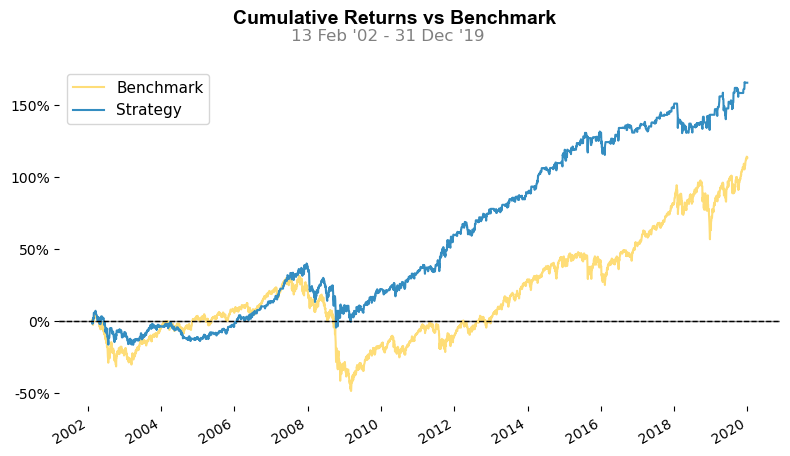

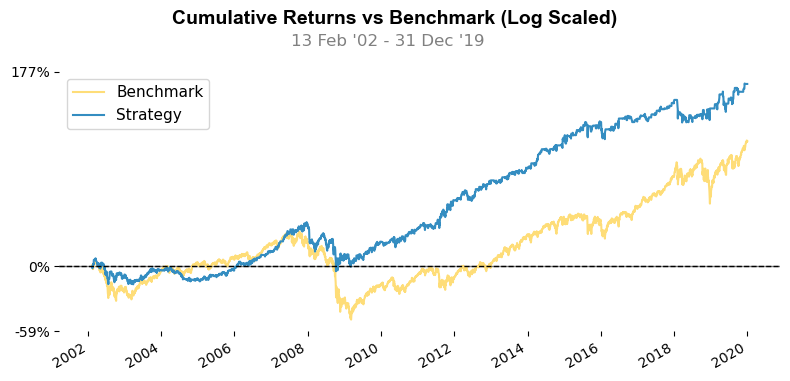

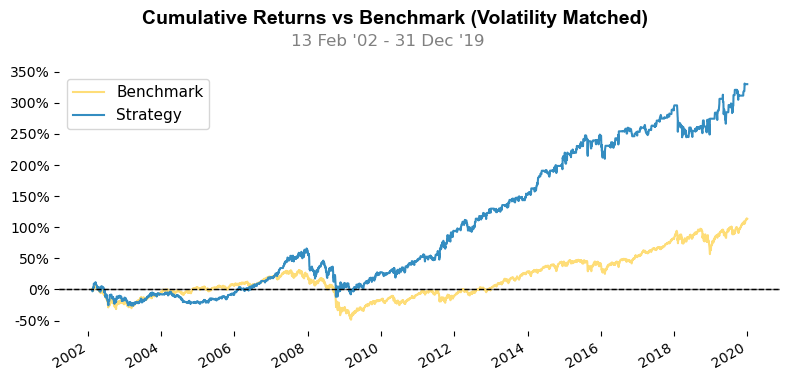

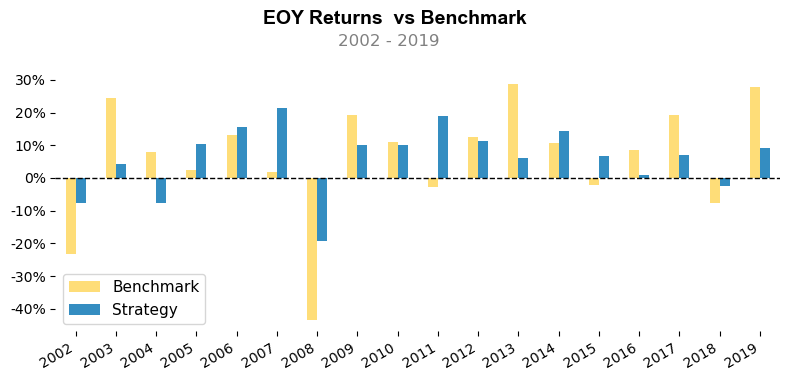

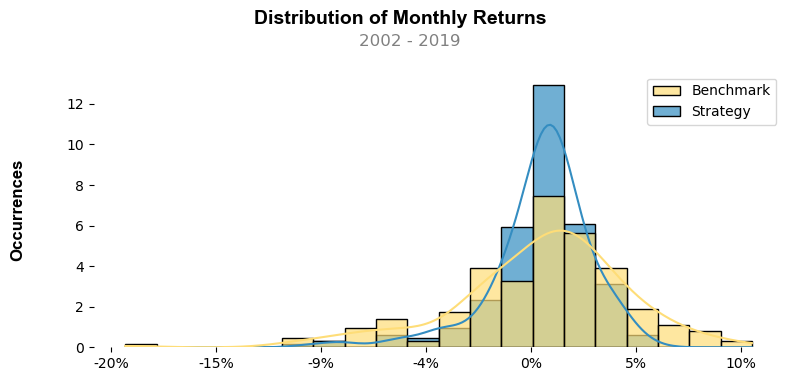

...

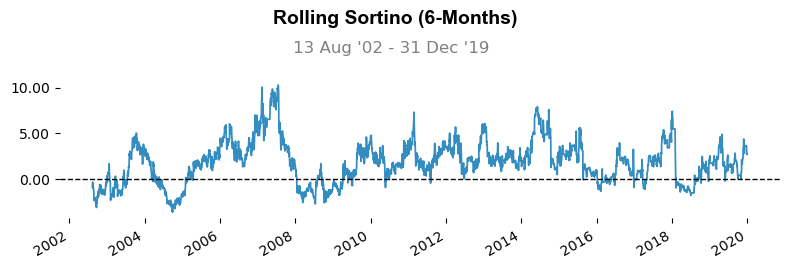

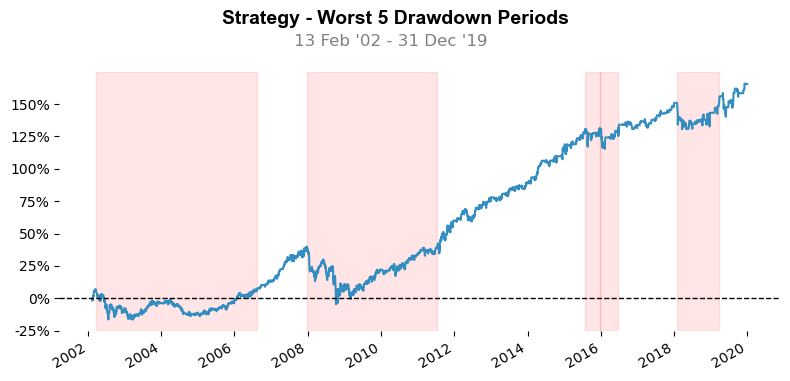

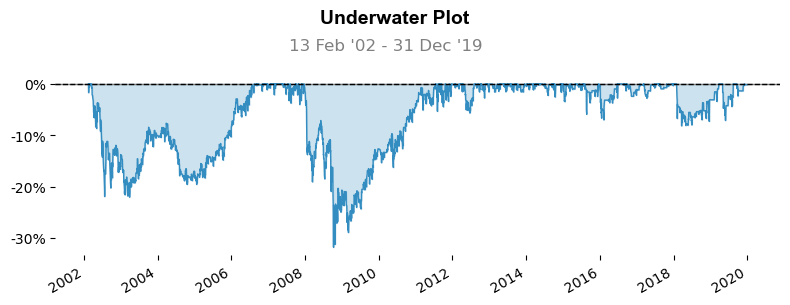

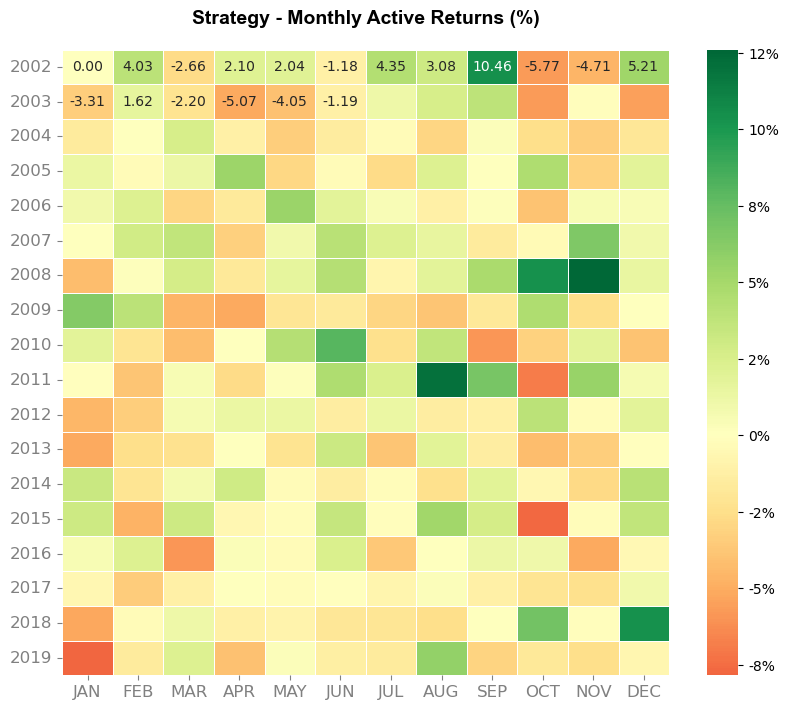

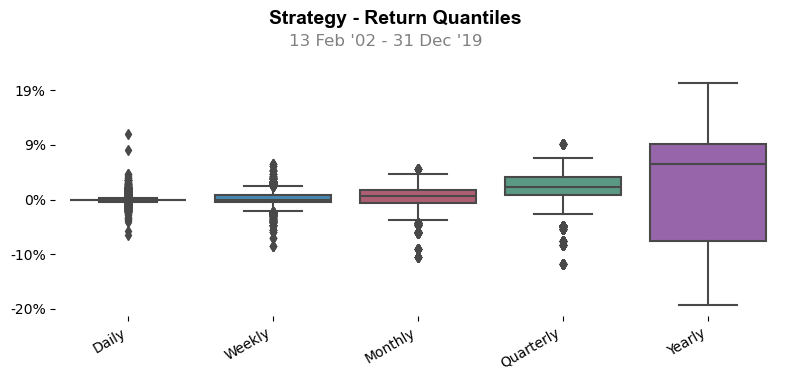

In [60]:
X_strat = feat_selector.transform(X.values)
X_strat = scaler.transform(X_strat)
X_strat = TimeseriesGenerator(X_strat, y, length=lookback)

df2 = df.iloc[lookback:,:].copy()
df2 = df2.reset_index(drop=True)

df2['Signal'] = np.where(model.predict(X_strat)>0.5,1,0)[:,0]

df2['Entry'] = np.where(df2['Signal']==1, df2['Close'], 0)

df2['Exit'] = np.where((df2['Entry']!=0) & (df2['Open'].shift(-1) <= df2['Close']), df2['Open'].shift(-1), 0)
df2['Exit'] = np.where((df2['Entry']!=0) & (df2['Open'].shift(-1) > df2['Close']), df2['Close'].shift(-1), df2['Exit'])

if (df2['Exit'].iloc[-1] == 0.0) & (df2['Signal'].iloc[-1] == 1):
    df2['Exit'].iloc[-1] = df2['Entry'].iloc[-1]

df2['P&L'] = df2['Exit'] - df2['Entry']

df2['Equity'] = df2['P&L'].cumsum() + df2['Close'][0]

df2['Returns'] = np.log(df2['Close']).diff().fillna(0)

df2['Strategy'] = (df2['Equity']/df2['Equity'].shift(1) - 1).fillna(0)

df3 = df2.copy()
df3.index = pd.to_datetime(df3['Date'])

qs.reports.full(df3['Strategy'], df3['Returns'])

The results of the trading backtest look promising. We see that our model's strategy outperforms buy and hold by 46% over 18+ years, which is reasonable but not outstanding. We can also see the Sharpe ratio is 0.53 vs 0.32 for the baseline strategy, which is again an improvement but by no means truly outstanding. Our model strategy is resilient more resilient to drawdowns and general volatility, as we can see in the volatility-matched chart, rolling volatility, and max drawdown stats. In fact, much of the raw returns we see in our strategy come via this improved performance in drawdown periods. Our monthly returns are quite clustered, which could imply we are often missing out on some obvious large positive movement days but also some large negative movements, leading to the generally safe strategy we see. We also see this in the barchart comparing end of year returns, where our strategy (particularly in the untrained test data portion) seems to miss many easy gain opportunities in good market years. This further reduces confidence in the model and implies a need to return to additional features or even additional hyperparameter tuning.

## Conclusion

Through this report, we have seen that our LSTM model is only marginally better than a random choice model when labeling up trends in price data. Trend prediciton is difficult to master, and while we can see that our model does slightly beat the market in a backtest over the sampled period, it is by no means significant or sufficient to show any confidence in our methods. We did see effective feature selection and hyperparameter tuning take place, which can be used again, but the model may need further feature enginnering with additional non-price indicators. With the potential use of associated derivatives pricing, volatility indexing, sentinment analysis, or other various financial instruments we could see improvement in this recurrent neural network model. Further study could be done in this model's viability in navigating bear markets; however for the limited study we have done here, it does not appear sufficient to deploy on a portfolio with the confidence to outperform the market meaningfully, espoecially in bull environments.